In [2]:
from google.colab import files
import zipfile
import shutil
from sklearn.model_selection import train_test_split
from glob import glob
import os
import cv2
import matplotlib.pyplot as plt
from collections import defaultdict
import numpy as np
from IPython.display import Image, display

In [1]:
# Upload dataset
uploaded = files.upload()

Saving currency_dataset_.zip to currency_dataset_.zip


In [3]:
# Unzip uploaded dataset
with zipfile.ZipFile("currency_dataset_.zip", 'r') as zip_ref:
    zip_ref.extractall("currency_dataset")

# Check files
!ls currency_dataset

train


In [4]:
!git clone https://github.com/ultralytics/yolov5
%cd yolov5
%pip install -r requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 17483, done.
remote: Counting objects: 100% (109/109), done.
remote: Compressing objects: 100% (79/79), done.
remote: Total 17483 (delta 79), reused 30 (delta 30), pack-reused 17374 (from 4)
Receiving objects: 100% (17483/17483), 16.39 MiB | 16.93 MiB/s, done.
Resolving deltas: 100% (11984/11984), done.
/content/yolov5
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 87.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 68.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 55.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 15.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s

In [5]:
# Set paths
image_dir = "/content/currency_dataset/train/images"
label_dir = "/content/currency_dataset/train/labels"
dataset_root = "/content/yolov5/currency_data"

# Create folders
for split in ["train", "val"]:
    os.makedirs(f"{dataset_root}/images/{split}", exist_ok=True)
    os.makedirs(f"{dataset_root}/labels/{split}", exist_ok=True)

# List all images
images = sorted(glob(os.path.join(image_dir, "*.jpg")))

# Train/val split
train_imgs, val_imgs = train_test_split(images, test_size=0.2, random_state=42)

def copy_data(img_list, split):
    for img_path in img_list:
        filename = os.path.basename(img_path)
        label_path = os.path.join(label_dir, filename.replace(".jpg", ".txt"))
        shutil.copy(img_path, f"{dataset_root}/images/{split}/{filename}")
        shutil.copy(label_path, f"{dataset_root}/labels/{split}/{filename.replace('.jpg', '.txt')}")

copy_data(train_imgs, "train")
copy_data(val_imgs, "val")

In [19]:
print(len(images))
print(len(train_imgs))
print(len(val_imgs))

10021
8016
2005


In [6]:
label_files = glob(f"{dataset_root}/labels/train/*.txt") + glob(f"{dataset_root}/labels/val/*.txt")

# Collect all class IDs
class_ids = set()
for file in label_files:
    with open(file, 'r') as f:
        for line in f:
            if line.strip():
                class_id = int(line.strip().split()[0])
                class_ids.add(class_id)

# Determine number of classes
num_classes = len(class_ids)
class_names = [f"class_{i}" for i in range(num_classes)]  # or give real names if known

# Write YAML file
yaml_path = "/content/yolov5/currency.yaml"
with open(yaml_path, "w") as f:
    f.write(f"""train: {dataset_root}/images/train
val: {dataset_root}/images/val

nc: {num_classes}
names: {class_names}
""")

print(f"Detected {num_classes} classes: {class_names}")

Detected 12 classes: ['class_0', 'class_1', 'class_2', 'class_3', 'class_4', 'class_5', 'class_6', 'class_7', 'class_8', 'class_9', 'class_10', 'class_11']


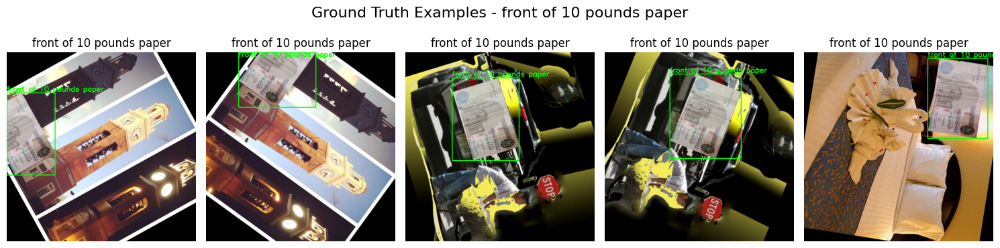

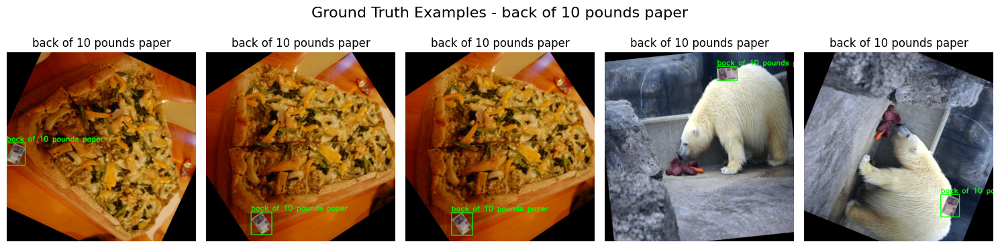

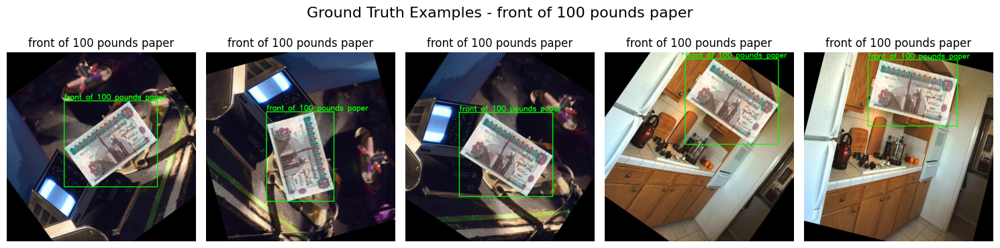

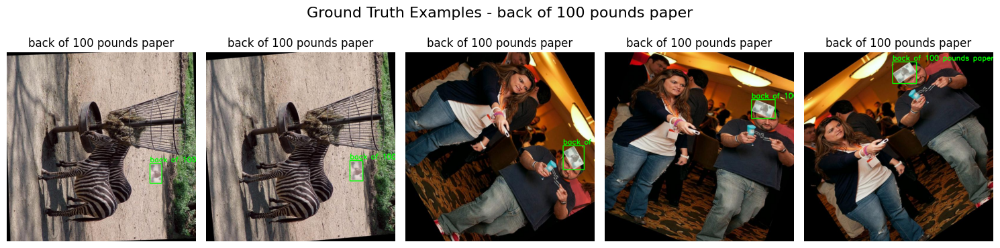

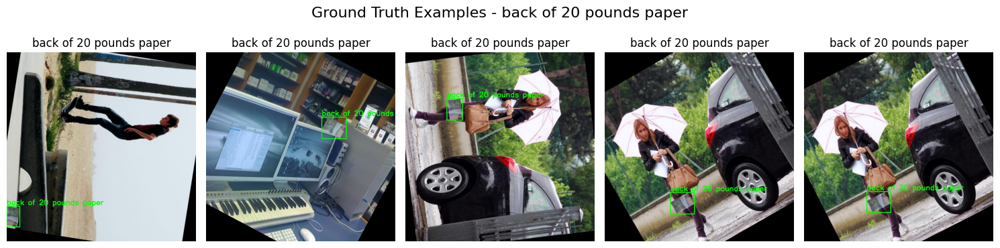

...

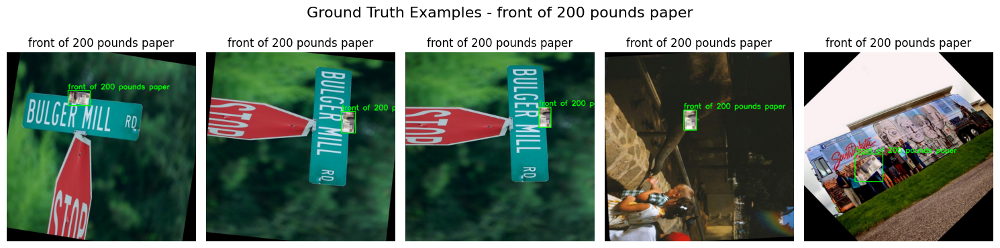

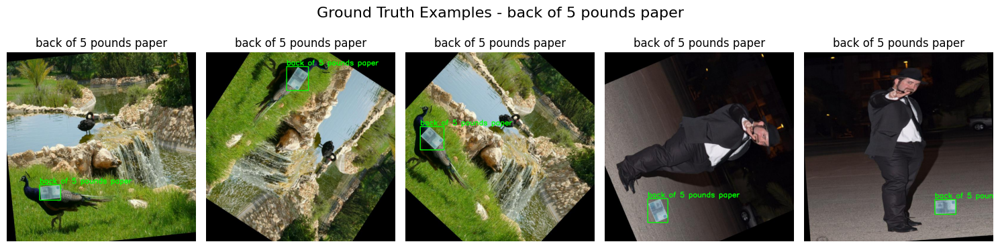

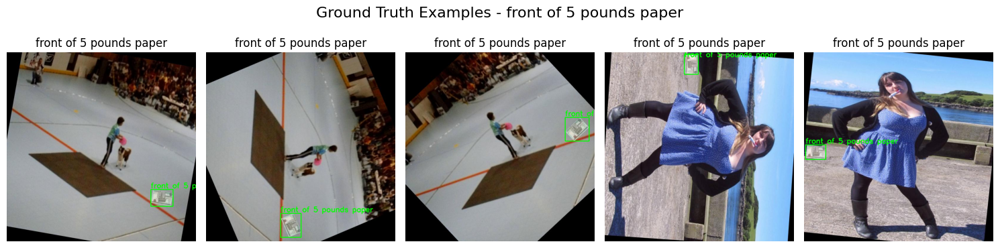

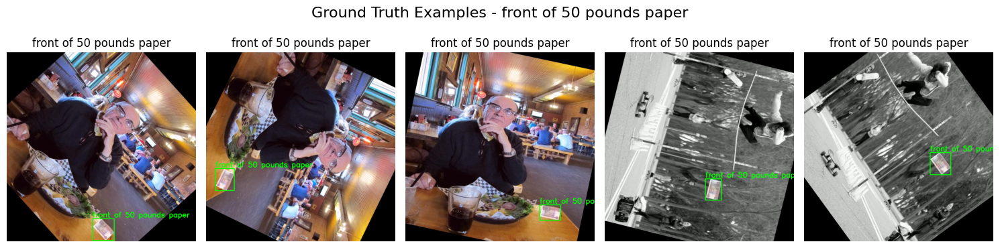

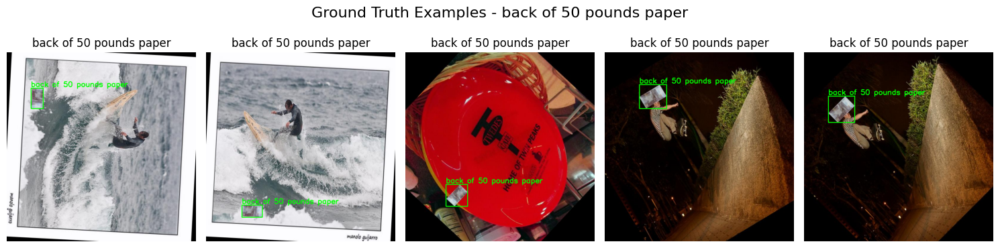

In [29]:
# === Set Paths ===
dataset_root = "/content/yolov5/currency_data"
train_images_dir = f"{dataset_root}/images/train"
train_labels_dir = f"{dataset_root}/labels/train"

# === Define class names ===
class_names = [
    "front of 10 pounds paper",  # class_0
    "back of 5 pounds paper",    # class_1
    "back of 50 pounds paper",   # class_2
    "back of 10 pounds paper",   # class_3
    "front of 100 pounds paper", # class_4
    "back of 20 pounds paper",   # class_5
    "front of 200 pounds paper", # class_6
    "back of 200 pounds paper",  # class_7
    "front of 50 pounds paper",  # class_8
    "front of 20 pounds paper",  # class_9
    "front of 5 pounds paper",   # class_10
    "back of 100 pounds paper"   # class_11
]

# === Load images and group by class ===
image_paths = sorted(glob.glob(os.path.join(train_images_dir, "*.jpg")))
images_per_class = defaultdict(list)

for img_path in image_paths:
    # Get corresponding label file
    label_path = os.path.join(train_labels_dir, os.path.basename(img_path).replace(".jpg", ".txt"))
    if not os.path.exists(label_path):
        continue

    img = cv2.imread(img_path)
    h, w = img.shape[:2]

    with open(label_path, 'r') as f:
        labels = f.readlines()

    for label in labels:
        class_id, x_center, y_center, width, height = map(float, label.strip().split())
        class_id = int(class_id)

        # Convert YOLO to pixel coords
        x_center *= w
        y_center *= h
        width *= w
        height *= h
        x1 = int(x_center - width / 2)
        y1 = int(y_center - height / 2)
        x2 = int(x_center + width / 2)
        y2 = int(y_center + height / 2)

        # Draw bounding box & label
        img_copy = img.copy()
        label_text = class_names[class_id]
        cv2.rectangle(img_copy, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(img_copy, label_text, (x1, max(15, y1 - 5)), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)

        # Save image per class
        if len(images_per_class[class_id]) < 5:
            images_per_class[class_id].append(cv2.cvtColor(img_copy, cv2.COLOR_BGR2RGB))
        break  # Only one image per class at a time

# === Plot images per class ===
for class_id, imgs in images_per_class.items():
    num_imgs = len(imgs)
    plt.figure(figsize=(num_imgs * 3, 4))

    for i, img in enumerate(imgs):
        plt.subplot(1, num_imgs, i + 1)
        plt.imshow(img)
        plt.title(f"{class_names[class_id]}", fontsize=12)
        plt.axis('off')

    plt.suptitle(f"Ground Truth Examples - {class_names[class_id]}", fontsize=16)
    plt.tight_layout()
    plt.show()


In [8]:
!python train.py --img 640 --batch 32 --epochs 40 --data currency.yaml --weights yolov5s.pt --name currency_yolov5

Streaming output truncated to the last 5000 lines.
      30/39      8.73G    0.01296   0.004849   0.006245         54        640:  28% 70/251 [00:49<02:31,  1.19it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      30/39      8.73G    0.01297   0.004859   0.006242         62        640:  28% 71/251 [00:49<02:11,  1.37it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      30/39      8.73G    0.01295   0.004856   0.006279         63        640:  29% 72/251 [00:50<02:05,  1.43it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
      30/39      8.73G    0.01293 

In [9]:
# Run detection on a sample image
!python detect.py --weights runs/train/currency_yolov5/weights/best.pt --img 640 --conf 0.25 --source /content/yolov5/currency_data/images/val/

detect: weights=['runs/train/currency_yolov5/weights/best.pt'], source=/content/yolov5/currency_data/images/val/, data=data/coco128.yaml, imgsz=[640, 640], conf_thres=0.25, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-419-gcd44191c Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7042489 parameters, 0 gradients, 15.9 GFLOPs
image 1/2005 /content/yolov5/currency_data/images/val/10-back_151159495_jpg.rf.480acbf857e7c72a3db7e22c442ecf8b.jpg: 640x640 1 class_0, 11.5ms
image 2/2005 /content/yolov5/currency_data/images/val/10-back_155366660_jpg.rf.32fd345293a54c4812a44438465275df.jpg: 640x640 1 class_0, 1

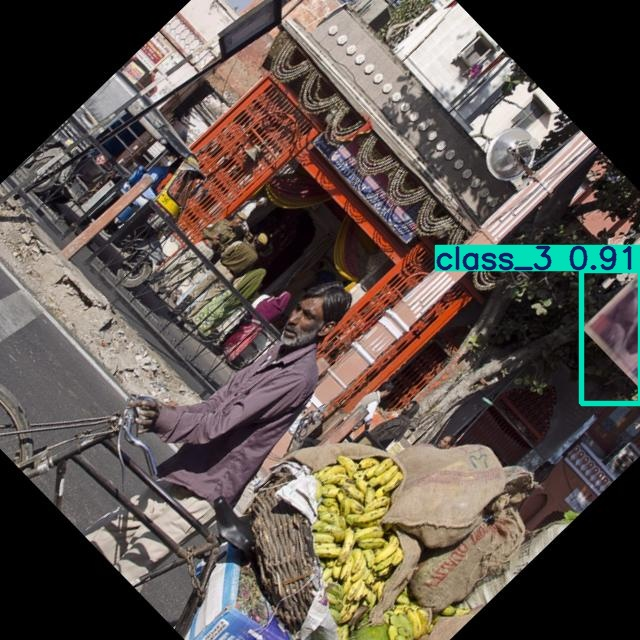

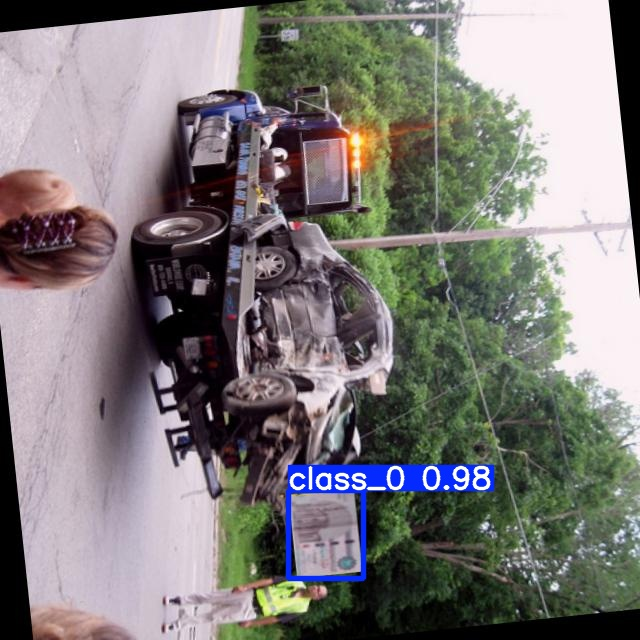

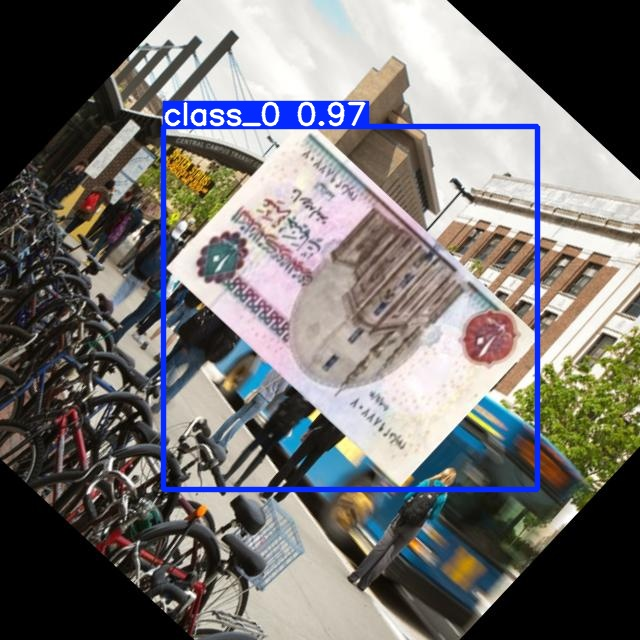

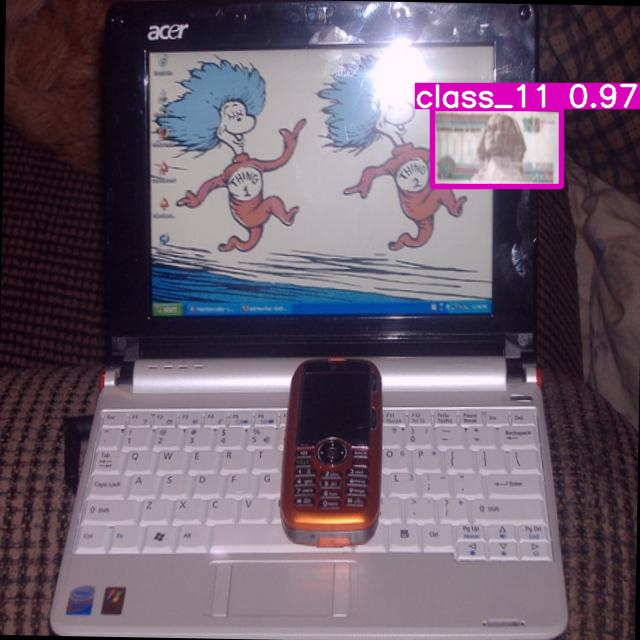

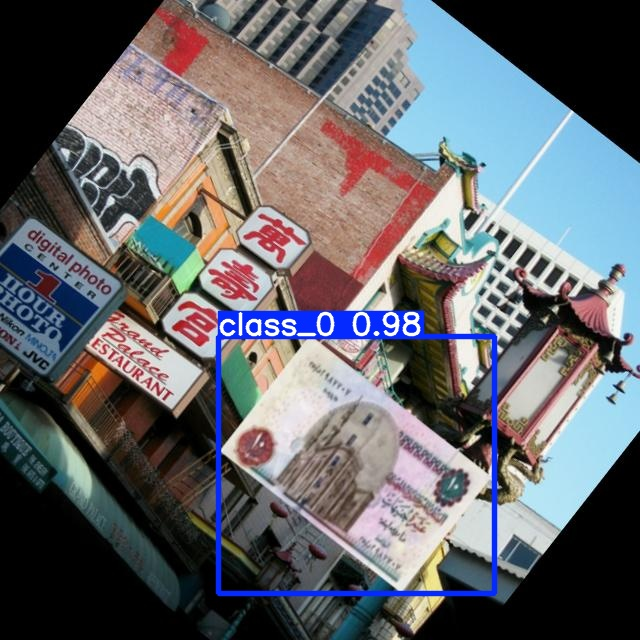

...

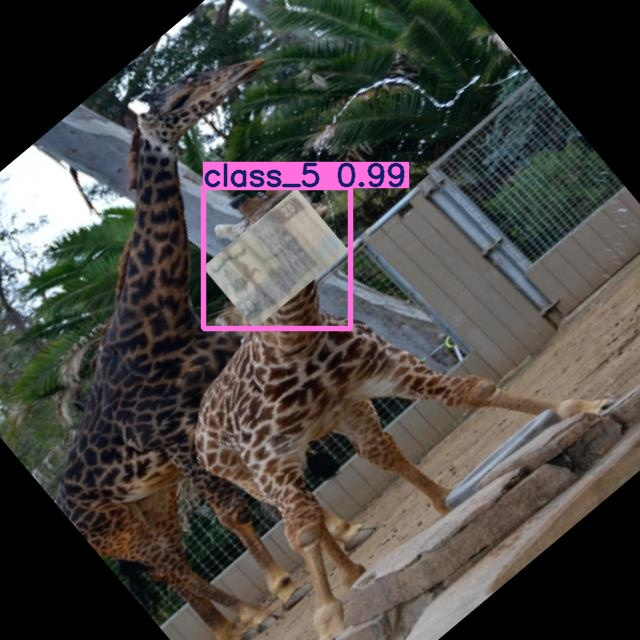

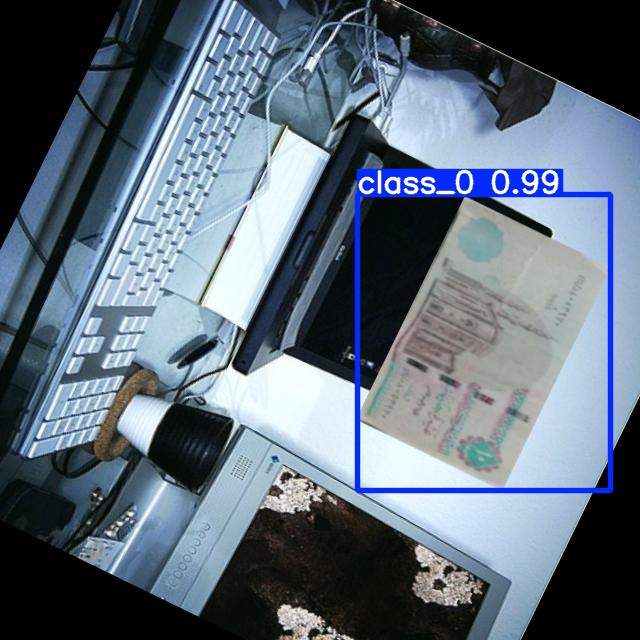

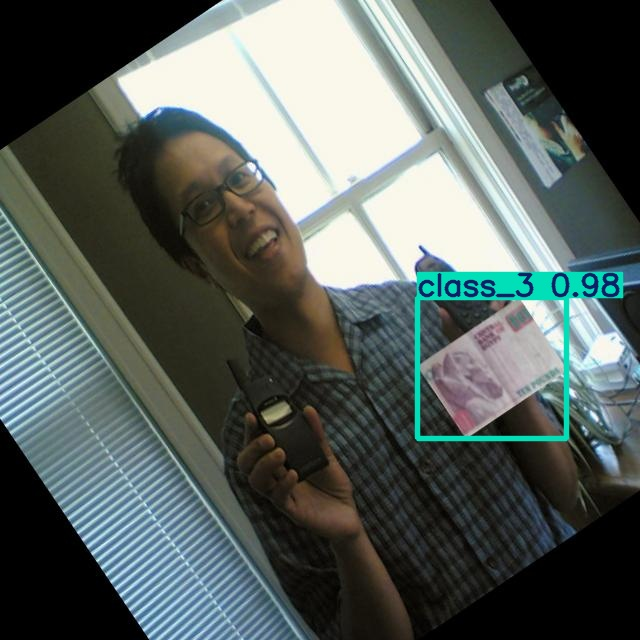

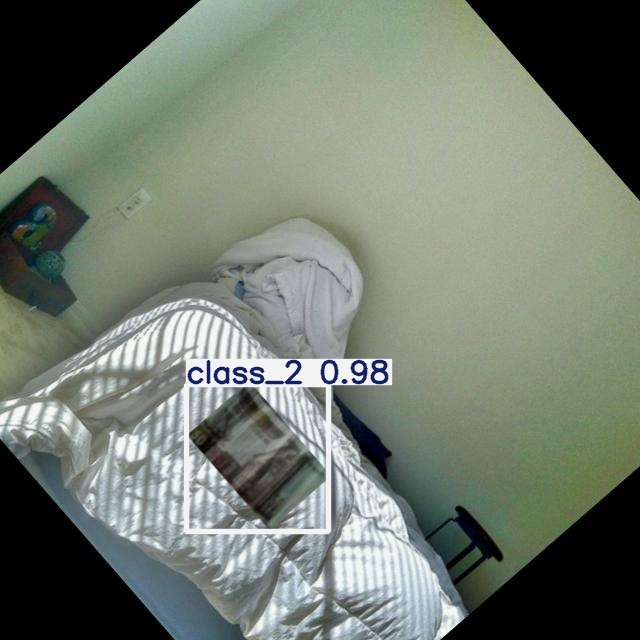

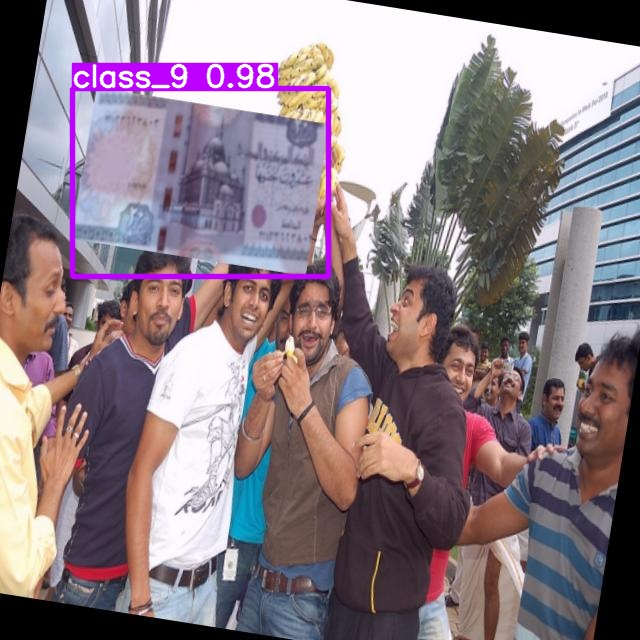

In [31]:
import glob
from IPython.display import Image, display

# Load all detected images
result_images = glob.glob('runs/detect/exp/*.jpg')

# Limit to 15 samples only
for img_path in result_images[:20]:
    display(Image(filename=img_path))

In [12]:
!python val.py --weights runs/train/currency_yolov5/weights/best.pt --data currency.yaml --img 640 --conf 0.25

val: data=currency.yaml, weights=['runs/train/currency_yolov5/weights/best.pt'], batch_size=32, imgsz=640, conf_thres=0.25, iou_thres=0.6, max_det=300, task=val, device=, workers=8, single_cls=False, augment=False, verbose=False, save_txt=False, save_hybrid=False, save_conf=False, save_json=False, project=runs/val, name=exp, exist_ok=False, half=False, dnn=False
WARNING ⚠️ confidence threshold 0.25 > 0.001 produces invalid results
YOLOv5 🚀 v7.0-419-gcd44191c Python-3.11.12 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)

Fusing layers... 
Model summary: 157 layers, 7042489 parameters, 0 gradients, 15.9 GFLOPs
val: Scanning /content/yolov5/currency_data/labels/val.cache... 2005 images, 10 backgrounds, 0 corrupt: 100% 2005/2005 [00:00<?, ?it/s]
                 Class     Images  Instances          P          R      mAP50   mAP50-95: 100% 63/63 [00:29<00:00,  2.10it/s]
                   all       2005       1995      0.998      0.995      0.995      0.988
               class_0       2005 